# Computing Sound Speed Profile from CTD Data
This notebook exeriments with getting CTD data from ooi server, and reading it into python via CSV.
Then, it calculates the sound speed profile of the water column

In [1]:
import csv
import numpy as np
from matplotlib import pyplot as plt
import math as m
import matplotlib
from datetime import date, timedelta
import datetime
import pandas as pd
import seaborn as sns
import plotly.express as px

In [2]:
file_name = 'CSVs/oregon_slope_base_deep_profiler_CTD_20190714_20190715.csv'

pressures_dbar = np.array(pd.read_csv(file_name,usecols=['pressure']))
temps_C = np.array(pd.read_csv(file_name,usecols=['temp']))
salinities_ppt = np.array(pd.read_csv(file_name,usecols=['practical_salinity']))

time = np.array(pd.read_csv(file_name,usecols=['time']))

data_time = []
for k in range(time.shape[0]):
    ref_date = datetime.datetime(1900,1,1)      # This is the "days since" part
    time_since_ref = timedelta(seconds=int(time[k]))     # Create a time delta object from the number of days
    data_time.append(ref_date + time_since_ref)      # Add the specified number of days to 1990


# Convert to float instead of string
pressures_dbar = pressures_dbar[1:].astype(np.float)
temps_C = temps_C[1:].astype(np.float)
salinities_ppt = salinities_ppt[1:].astype(np.float)

pressures_MPa = pressures_dbar*0.01

In [3]:
print(type(data_time[0]))

<class 'datetime.datetime'>


Text(0.5, 1.0, 'Temperature vs. Pressure')

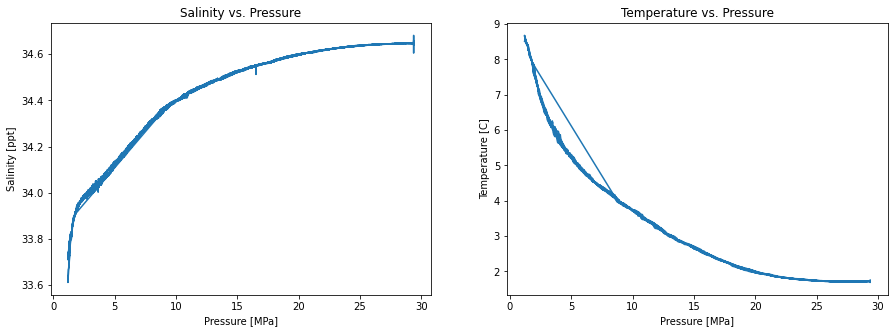

In [4]:
f1 = plt.figure(figsize=(15, 5))

plt.subplot(1,2,1)
plt.plot(pressures_MPa,salinities_ppt)
plt.xlabel('Pressure [MPa]')
plt.ylabel('Salinity [ppt]')
plt.title('Salinity vs. Pressure')

plt.subplot(1,2,2)
plt.plot(pressures_MPa,temps_C)
plt.xlabel('Pressure [MPa]')
plt.ylabel('Temperature [C]')
plt.title('Temperature vs. Pressure')

In [5]:
# literally just typing out equation

C00 = 1402.388
A02 = 7.166E-5
C01 = 5.03830
A03 = 2.008E-6
C02 = -5.81090E-2
A04 = -3.21E-8
C03 = 3.3432E-4
A10 = 9.4742E-5
C04 = -1.47797E-6
A11 = -1.2583E-5
C05 = 3.1419E-9
A12 = -6.4928E-8
C10 = 0.153563
A13 = 1.0515E-8
C11 = 6.8999E-4
A14 = -2.0142E-10
C12 = -8.1829E-6
A20 = -3.9064E-7
C13 = 1.3632E-7
A21 = 9.1061E-9
C14 = -6.1260E-10
A22 = -1.6009E-10
C20 = 3.1260E-5
A23 = 7.994E-12

C21 = -1.7111E-6
A30 = 1.100E-10
C22 = 2.5986E-8
A31 = 6.651E-12
C23 = -2.5353E-10
A32 = -3.391E-13
C24 = 1.0415E-12
B00 = -1.922E-2
C30 = -9.7729E-9
B01 = -4.42E-5
C31 = 3.8513E-10
B10 = 7.3637E-5
C32 = -2.3654E-12
B11 = 1.7950E-7
A00 = 1.389
D00 = 1.727E-3
A01 = -1.262E-2
D10 = -7.9836E-6 

T = 3
S = 1
P = 700
T = temps_C
S = salinities_ppt
P = pressures_MPa*10

D = D00 + D10*P 
B = B00 + B01*T + (B10 + B11*T)*P 
A = (A00 + A01*T + A02*T**2 + A03*T**3 + A04*T**4) + (A10 + A11*T + A12*T**2 + A13*T**3 + A14*T**4)*P + (A20 + A21*T + A22*T**2 + A23*T**3)*P**2 + (A30 + A31*T + A32*T**2)*P**3
Cw = (C00 + C01*T + C02*T**2 + C03*T**3 + C04*T**4 + C05*T**5) + (C10 + C11*T + C12*T**2 + C13*T**3 + C14*T**4)*P + (C20 +C21*T +C22*T**2 + C23*T**3 + C24*T**4)*P**2 + (C30 + C31*T + C32*T**2)*P**3


# Calculate Speed of Sound
c = Cw + A*S + B*S**(3/2) + D*S**2

In [6]:
# Calculate Depth from pressure
lat = 44.52757 #deg

# Calculate gravity constant for given latitude
g_phi = 9.780319*(1 + 5.2788E-3*(np.sin(np.deg2rad(lat))**2) + 2.36E-5*(np.sin(np.deg2rad(lat))**4))

# Calculate Depth for Pressure array
depth_m = (9.72659e2*pressures_MPa - 2.512e-1*pressures_MPa**2 + 2.279e-4*pressures_MPa**3 - 1.82e-7*pressures_MPa**4)/(g_phi + 1.092e-4*pressures_MPa)

### Find Density at Seafloor

[1.7196]
[34.64744925]
[2890.32961717]
[1505.3940092]


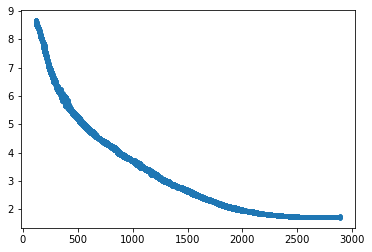

In [7]:
plt.plot(depth_m, temps_C,'.')

print(temps_C[-1])
print(salinities_ppt[-1])
print(depth_m[-1])
print(c[-1])

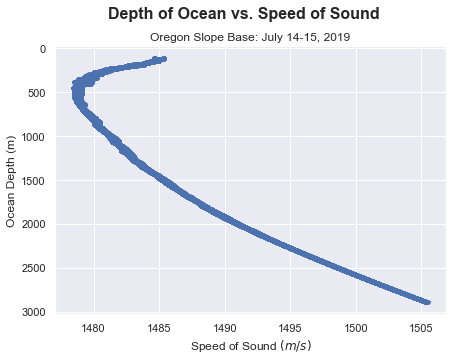

In [8]:
min_idx = np.argmin(c)
x = c[min_idx]
y = depth_m[min_idx]

sns.set()

fig = plt.figure(figsize=(7,5))

fig.suptitle('Depth of Ocean vs. Speed of Sound', fontsize=16, fontweight='bold')

ax = fig.add_subplot(111)
ax.set_title('Oregon Slope Base: July 14-15, 2019',fontsize=12)
ax.plot(c,depth_m,'.')
fig.subplots_adjust(top=0.87)
ax.set_xlabel('Speed of Sound $(m/s)$')
ax.set_ylabel('Ocean Depth (m)')
plt.gca().invert_yaxis()

#ax.text(1482.5, 2750, 'Minimum Speed of Sound \nat {0:.4f} meters'.format(y))

#ax.plot(x,y,'o',markersize=10)

plt.show()
fig.savefig('Speed_of_sound_profile_deep.png', dpi=500)

In [9]:
from datetime import date, timedelta

start = date(1900,1,1)      # This is the "days since" part

delta = timedelta(seconds=3653078571)     # Create a time delta object from the number of days

offset = start + delta      # Add the specified number of days to 1990

print(offset)               # >>>  2015-12-01
print(type(offset))         # >>>  <class 'datetime.date'>


2015-10-06
<class 'datetime.date'>


## Get CTD Data from Shallow Profiler

In [10]:
file_name = 'CSVs/oregon_slope_base_shallow_profiler_CTD_20190714_20190715.csv'

pressures_dbar = np.array(pd.read_csv(file_name,usecols=['seawater_pressure']))
temps_C = np.array(pd.read_csv(file_name,usecols=['seawater_temperature']))
salinities_ppt = np.array(pd.read_csv(file_name,usecols=['practical_salinity']))

# Convert to float instead of string
pressures_dbar = pressures_dbar[1:].astype(np.float)
temps_C = temps_C[1:].astype(np.float)
salinities_ppt = salinities_ppt[1:].astype(np.float)

pressures_MPa = pressures_dbar*0.01

In [11]:
# literally just typing out equation

C00 = 1402.388
A02 = 7.166E-5
C01 = 5.03830
A03 = 2.008E-6
C02 = -5.81090E-2
A04 = -3.21E-8
C03 = 3.3432E-4
A10 = 9.4742E-5
C04 = -1.47797E-6
A11 = -1.2583E-5
C05 = 3.1419E-9
A12 = -6.4928E-8
C10 = 0.153563
A13 = 1.0515E-8
C11 = 6.8999E-4
A14 = -2.0142E-10
C12 = -8.1829E-6
A20 = -3.9064E-7
C13 = 1.3632E-7
A21 = 9.1061E-9
C14 = -6.1260E-10
A22 = -1.6009E-10
C20 = 3.1260E-5
A23 = 7.994E-12

C21 = -1.7111E-6
A30 = 1.100E-10
C22 = 2.5986E-8
A31 = 6.651E-12
C23 = -2.5353E-10
A32 = -3.391E-13
C24 = 1.0415E-12
B00 = -1.922E-2
C30 = -9.7729E-9
B01 = -4.42E-5
C31 = 3.8513E-10
B10 = 7.3637E-5
C32 = -2.3654E-12
B11 = 1.7950E-7
A00 = 1.389
D00 = 1.727E-3
A01 = -1.262E-2
D10 = -7.9836E-6 

T = 3
S = 1
P = 700
T = temps_C
S = salinities_ppt
P = pressures_MPa*10

D = D00 + D10*P 
B = B00 + B01*T + (B10 + B11*T)*P 
A = (A00 + A01*T + A02*T**2 + A03*T**3 + A04*T**4) + (A10 + A11*T + A12*T**2 + A13*T**3 + A14*T**4)*P + (A20 + A21*T + A22*T**2 + A23*T**3)*P**2 + (A30 + A31*T + A32*T**2)*P**3
Cw = (C00 + C01*T + C02*T**2 + C03*T**3 + C04*T**4 + C05*T**5) + (C10 + C11*T + C12*T**2 + C13*T**3 + C14*T**4)*P + (C20 +C21*T +C22*T**2 + C23*T**3 + C24*T**4)*P**2 + (C30 + C31*T + C32*T**2)*P**3


# Calculate Speed of Sound
c_shallow = Cw + A*S + B*S**(3/2) + D*S**2

In [12]:
# Calculate Depth from pressure
lat = 44.52757 #deg

# Calculate gravity constant for given latitude
g_phi = 9.780319*(1 + 5.2788E-3*(np.sin(np.deg2rad(lat))**2) + 2.36E-5*(np.sin(np.deg2rad(lat))**4))

# Calculate Depth for Pressure array
depth_m_shallow = (9.72659e2*pressures_MPa - 2.512e-1*pressures_MPa**2 + 2.279e-4*pressures_MPa**3 - 1.82e-7*pressures_MPa**4)/(g_phi + 1.092e-4*pressures_MPa)

In [13]:
# Cut Shallow data to just 8 passes
depth_m_shallow = depth_m_shallow[1197:35467]
c_shallow = c_shallow[1197:35467]

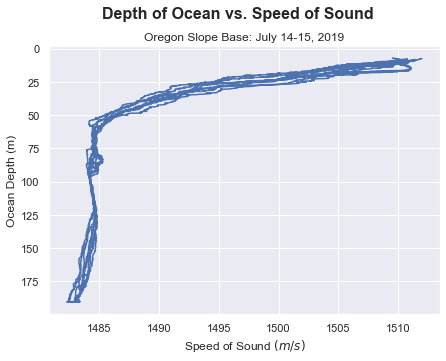

In [14]:

fig = plt.figure(figsize=(7,5))

fig.suptitle('Depth of Ocean vs. Speed of Sound', fontsize=16, fontweight='bold')

ax = fig.add_subplot(111)
ax.set_title('Oregon Slope Base: July 14-15, 2019',fontsize=12)
ax.plot(c_shallow,depth_m_shallow)
fig.subplots_adjust(top=0.87)
ax.set_xlabel('Speed of Sound $(m/s)$')
ax.set_ylabel('Ocean Depth (m)')
plt.gca().invert_yaxis()

#ax.text(1482.5, 2750, 'Minimum Speed of Sound \nat {0:.4f} meters'.format(y))

#ax.plot(x,y,'o',markersize=10)

plt.show()
fig.savefig('Speed_of_sound_profile_shallow.png', dpi=500)

## Combine 2 SSPs

(118974, 1)
(34270, 1)


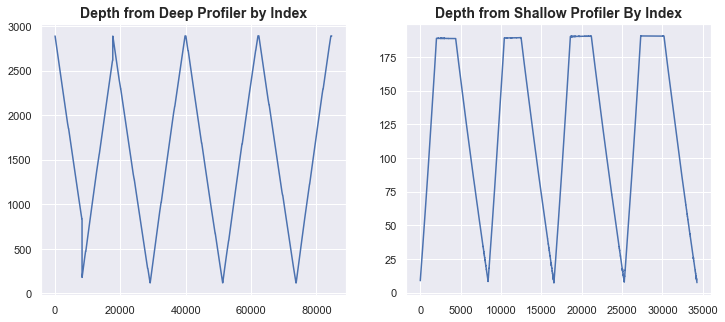

In [15]:
c_combined = np.concatenate((c,c_shallow))
depth_combined = np.concatenate((depth_m,depth_m_shallow))
print(c_combined.shape)
print(c_shallow.shape)

fig = plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(depth_m)
plt.title('Depth from Deep Profiler by Index',fontsize=14, fontweight='bold')

plt.subplot(1,2,2)
plt.plot(depth_m_shallow)
plt.title('Depth from Shallow Profiler By Index',fontsize=14, fontweight='bold')

fig.savefig('Depth_by_Index_for_both.png', dpi=500)

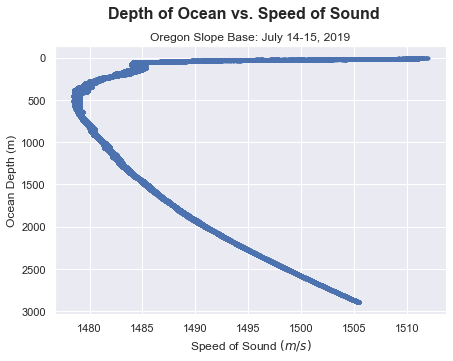

In [16]:
sns.set()
fig = plt.figure(figsize=(7,5))

fig.suptitle('Depth of Ocean vs. Speed of Sound', fontsize=16, fontweight='bold')

ax = fig.add_subplot(111)
ax.set_title('Oregon Slope Base: July 14-15, 2019',fontsize=12)
ax.plot(c_combined,depth_combined,'.')
fig.subplots_adjust(top=0.87)
ax.set_xlabel('Speed of Sound $(m/s)$')
ax.set_ylabel('Ocean Depth (m)')
plt.gca().invert_yaxis()

#ax.text(1482.5, 2750, 'Minimum Speed of Sound \nat {0:.4f} meters'.format(y))

#ax.plot(x,y,'o',markersize=10)

plt.show()
fig.savefig('Speed_of_sound_profile_full.png', dpi=500)

## Combine into 1 variable

In [17]:
ssp = np.hstack((depth_combined, c_combined))

In [18]:
print(ssp[0,1])

1505.372710145357


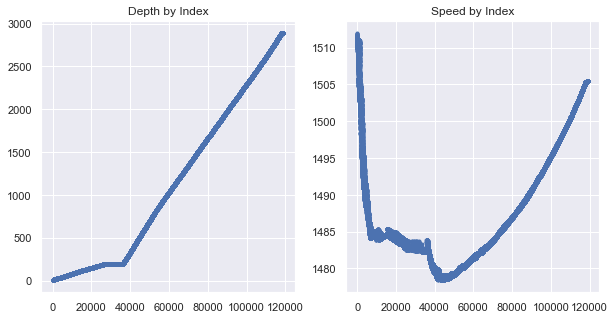

In [19]:
#Sort Data By Depth
ssp = ssp[ssp[:,0].argsort()]

depth_sort = ssp[:,0]
speed_sort = ssp[:,1]

fig = plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(depth_sort,'.')
plt.title('Depth by Index')
plt.subplot(1,2,2)
plt.plot(speed_sort,'.')
plt.title('Speed by Index')

fig.savefig('Depth_and_speed_by_index', dpi=500)


In [20]:
px.scatter(speed_sort)

#Cut out Redundant data points (hard coded)
ssp_cut = np.delete(ssp, np.s_[26053:36173], 0)

ssp_cut = np.delete(ssp, np.s_[7742:18015], 0)

depth_sort = ssp_cut[:,0]
speed_sort = ssp_cut[:,1]

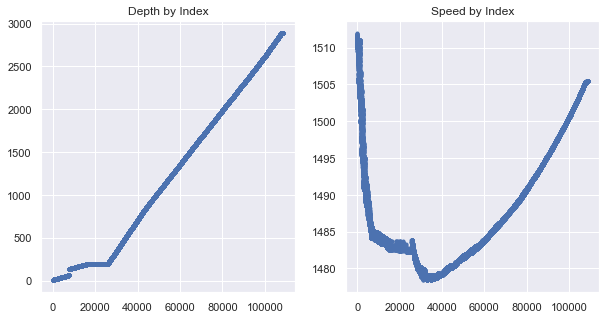

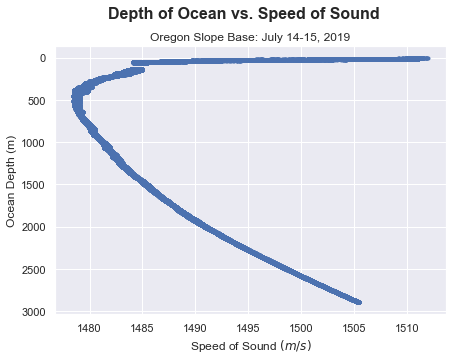

In [21]:
fig = plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(depth_sort,'.')
plt.title('Depth by Index')
plt.subplot(1,2,2)
plt.plot(speed_sort,'.')
plt.title('Speed by Index')

fig2 = plt.figure(figsize=(7,5))

fig2.suptitle('Depth of Ocean vs. Speed of Sound', fontsize=16, fontweight='bold')

ax = fig2.add_subplot(111)
ax.set_title('Oregon Slope Base: July 14-15, 2019',fontsize=12)
ax.plot(speed_sort,depth_sort,'.')
fig2.subplots_adjust(top=0.87)
ax.set_xlabel('Speed of Sound $(m/s)$')
ax.set_ylabel('Ocean Depth (m)')
plt.gca().invert_yaxis()

#ax.text(1482.5, 2750, 'Minimum Speed of Sound \nat {0:.4f} meters'.format(y))

#ax.plot(x,y,'o',markersize=10)

plt.show()
fig2.savefig('SSP_after_removing_redundant_depth.png')

## Calculate Moving Average for Data

In [22]:
N=700

depth_ma = np.convolve(depth_sort, np.ones((N,))/N, mode='valid')
speed_ma = np.convolve(speed_sort, np.ones((N,))/N, mode='valid')

Text(0.5, 1.0, 'Speed by Index')

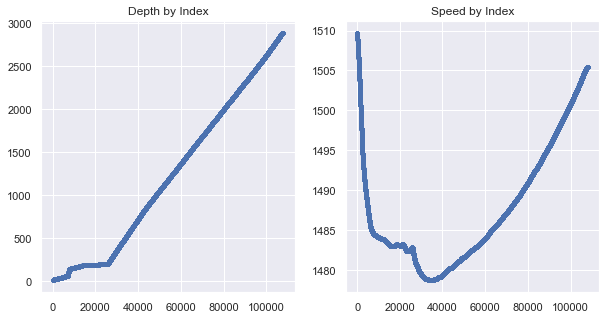

In [23]:
fig = plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(depth_ma,'.')
plt.title('Depth by Index')
plt.subplot(1,2,2)
plt.plot(speed_ma,'.')
plt.title('Speed by Index')

In [24]:
depth_ma_cut = np.delete(depth_ma, np.s_[18016:20028], 0)
speed_ma_cut = np.delete(speed_ma, np.s_[18016:20028], 0)

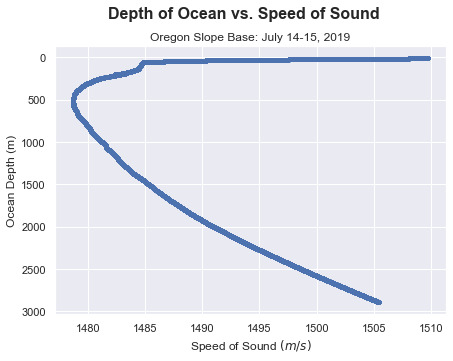

In [25]:
fig = plt.figure(figsize=(7,5))

fig.suptitle('Depth of Ocean vs. Speed of Sound', fontsize=16, fontweight='bold')

ax = fig.add_subplot(111)
ax.set_title('Oregon Slope Base: July 14-15, 2019',fontsize=12)
ax.plot(speed_ma_cut,depth_ma_cut,'.')
fig.subplots_adjust(top=0.87)
ax.set_xlabel('Speed of Sound $(m/s)$')
ax.set_ylabel('Ocean Depth (m)')
#ax.set_ylim([0,500])
#ax.set_xlim([1484.5, 1484.8])
#ax.set_ylim([50, 150])
plt.gca().invert_yaxis()

#ax.text(1482.5, 2750, 'Minimum Speed of Sound \nat {0:.4f} meters'.format(y))

#ax.plot(x,y,'o',markersize=10)

plt.show()
fig.savefig('Full_Sound_Speed_Profile_with_average_and_cut.png')

In [26]:
px.scatter(x=speed_ma_cut, y=depth_ma_cut)

In [27]:
ssp = np.vstack((depth_ma_cut, speed_ma_cut))
print(ssp.shape)

(2, 105990)


In [28]:
import CTD_Data

ssp = CTD_Data.calculate_ssp_from_CTD()

ModuleNotFoundError: No module named 'CTD_Data'

In [ ]:
from matplotlib import pyplot as plt

plt.plot(ssp[1,:],ssp[0,:])